## Compute Shortwave Narrow-to-Broadband Albedo and BSA, WSA, and Blue-sky 
## Using MODIS BRDF

In [1]:
# packages
import os
import sys
import folium
import contextily as ctx  # For adding a basemap

In [2]:
function_path = os.path.expanduser("~/geoscience/albedo_downscaling/sentinel_2/s2_functions")
sys.path.append(function_path)
# import all the helper functions.
from s2_20m_download_final import *

plt.style.use("~/geoscience/albedo_downscaling/MNRAS.mplstyle")
%matplotlib inline

### Download and process albedo data

Uncommnet the cell below and run the entire Python script here in Jupyter note

In [3]:
# %run ~/geoscience/albedo_downscaling/sentinel_2/s2_functions/s2_20m_download_final.py

### East river boundary

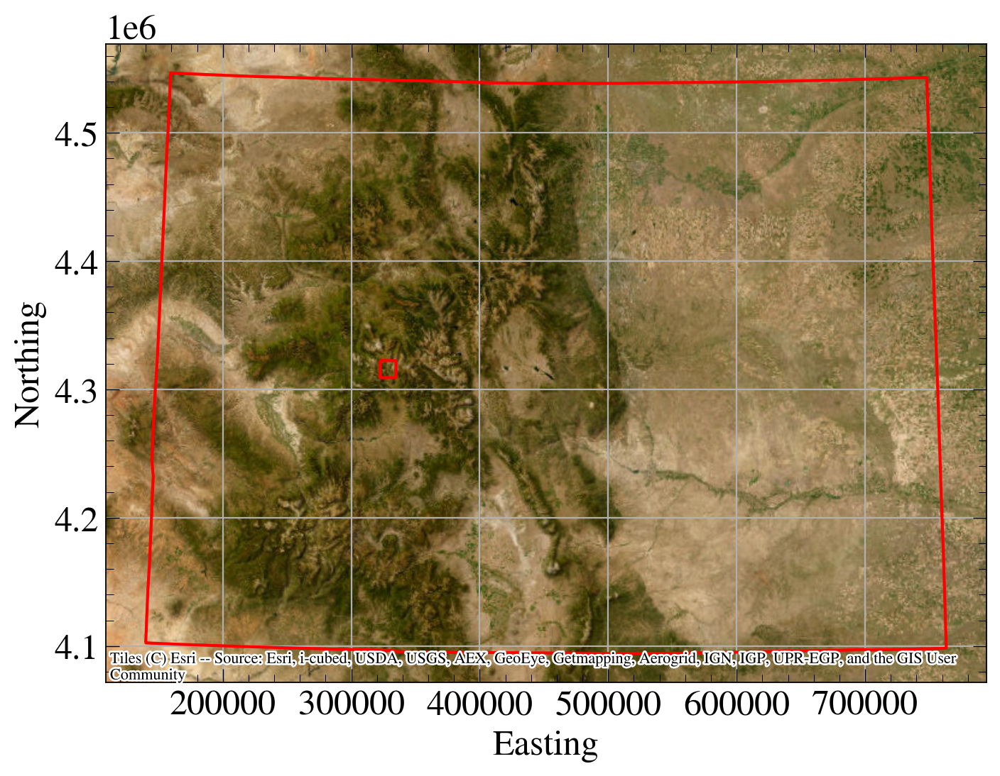

In [4]:
# Shapefile Data
epsg = "epsg:32613"
shapefile_path = '/bsuhome/tnde/scratch/felix/modis/East_River_SHP/ER_bbox.shp'
shapefile_path1 = '/bsuhome/tnde/geoscience/albedo_downscaling/GOES-Modis-Data-Preprocessing-main/shapefile_colorado/Colorado_State_Boundary/Colorado_State_Boundary.shp'

# -------------------------------
# Read shapefile and match CRS
# -------------------------------
shapefile = gpd.read_file(shapefile_path)
# Reproject shapefile to raster CRS
shapefile = shapefile.to_crs(epsg)

shapefile1 = gpd.read_file(shapefile_path1)
# Reproject shapefile to raster CRS
shapefile1 = shapefile1.to_crs(epsg)
   
fig, ax = plt.subplots(figsize=(8, 6))

# Shapefile overlay (as outline)
shapefile.boundary.plot(ax=ax, edgecolor="red", linewidth=1.5)
shapefile1.boundary.plot(ax=ax, edgecolor="red", linewidth=1.5)
ctx.add_basemap(ax, crs=epsg, source=ctx.providers.Esri.WorldImagery)

# ax.set_title("Slope raster")
ax.set_xlabel("Easting"); 
ax.set_ylabel("Northing")
# cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
# ax.set_label("Slope (degrees)")
# plt.tight_layout(); 
plt.show()

### Export to html

In [5]:
# -------------------------------
# Read shapefile
# -------------------------------
shapefile_path = '/bsuhome/tnde/scratch/felix/modis/East_River_SHP/ER_bbox.shp'
shapefile = gpd.read_file(shapefile_path)

# Reproject to WGS84 (lat/lon) for web mapping if needed
if shapefile.crs is None:
    raise ValueError("Shapefile has no CRS; set shapefile.crs before reprojecting.")
if shapefile.crs.to_epsg() != 4326:
    shapefile = shapefile.to_crs(epsg=4326)

# Get a reasonable center for the map (using the shapefile centroid)
centroid = shapefile.geometry.unary_union.centroid
center_lat, center_lon = centroid.y, centroid.x

# -------------------------------
# Create folium map with Esri World Imagery
# -------------------------------
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles=None  # we'll add Esri imagery manually
)

# Esri World Imagery basemap
folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/"
          "World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri World Imagery",
    name="Esri World Imagery",
    overlay=False,
    control=True,
).add_to(m)

# Overlay the shapefile
folium.GeoJson(
    shapefile,
    name="RCEW Boundary",
    style_function=lambda feature: {
        "color": "red",
        "weight": 5,
        "fill": False,
    },
).add_to(m)

# Layer control (toggle layers on/off)
folium.LayerControl().add_to(m)

# -------------------------------
# Save to HTML
# -------------------------------
out_html = "/bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/east_river_bbox.html"
m.save(out_html)
print(f"Saved interactive map to {out_html}")

Saved interactive map to /bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/east_river_bbox.html


/tmp/ipykernel_79948/2198433543.py:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = shapefile.geometry.unary_union.centroid


In [6]:
# # -------------------------------
# # Read shapefile
# # -------------------------------
# shapefile_path = '/bsuhome/tnde/scratch/felix/modis/East_River_SHP/ER_bbox.shp'
# shapefile = gpd.read_file(shapefile_path)

# Reproject to WGS84 (lat/lon) for web mapping if needed
if shapefile.crs is None:
    raise ValueError("Shapefile has no CRS; set shapefile.crs before reprojecting.")
if shapefile.crs.to_epsg() != 4326:
    shapefile = shapefile.to_crs(epsg=4326)

# Get a reasonable center for the map (using the shapefile centroid)
centroid = shapefile.geometry.unary_union.centroid
center_lat, center_lon = centroid.y, centroid.x

# -------------------------------
# Create folium map with Esri World Imagery
# -------------------------------
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,
    tiles=None  # we'll add Esri imagery manually
)

# Esri World Imagery basemap
folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/"
          "World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri World Imagery",
    name="Esri World Imagery",
    overlay=False,
    control=True,
).add_to(m)

# -------------------------------
# Add U.S. state boundaries (GeoJSON)
# -------------------------------
us_states_url = (
    "https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/"
    "data/geojson/us-states.json"
)

folium.GeoJson(
    us_states_url,
    name="US State Boundaries",
    style_function=lambda feature: {
        "color": "black",
        "weight": 5,   # line width for state boundaries
        "fill": False,
    },
).add_to(m)

# -------------------------------
# Overlay East River / ER bbox shapefile
# -------------------------------
folium.GeoJson(
    shapefile,
    name="RCEW / ER Boundary",
    style_function=lambda feature: {
        "color": "red",
        "weight": 5,
        "fill": False,
    },
).add_to(m)

# Layer control (toggle layers on/off)
folium.LayerControl().add_to(m)

# -------------------------------
# Save to HTML
# -------------------------------
out_html = "/bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/east_river_bbox_with_states.html"
m.save(out_html)
print(f"Saved interactive map to {out_html}")


Saved interactive map to /bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/east_river_bbox_with_states.html


/tmp/ipykernel_79948/3976307788.py:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = shapefile.geometry.unary_union.centroid


In [7]:
# -------------------------------
# Read shapefile
# -------------------------------
shapefile_path  = '/bsuhome/tnde/scratch/felix/modis/East_River_SHP/ER_bbox.shp'
shapefile_path1 = '/bsuhome/tnde/geoscience/albedo_downscaling/GOES-Modis-Data-Preprocessing-main/shapefile_colorado/Colorado_State_Boundary/Colorado_State_Boundary.shp'

shapefile  = gpd.read_file(shapefile_path)
shapefile1 = gpd.read_file(shapefile_path1)

# Reproject to WGS84 (lat/lon) for web mapping if needed
if shapefile.crs is None:
    raise ValueError("Shapefile has no CRS; set shapefile.crs before reprojecting.")
if shapefile.crs.to_epsg() != 4326:
    shapefile = shapefile.to_crs(epsg=4326)

if shapefile1.crs is None:
    raise ValueError("Shapefile1 has no CRS; set shapefile1.crs before reprojecting.")
if shapefile1.crs.to_epsg() != 4326:
    shapefile1 = shapefile1.to_crs(epsg=4326)

# Use the smaller AOI centroid as map center
centroid = shapefile.geometry.unary_union.centroid
center_lat, center_lon = centroid.y, centroid.x

# -------------------------------
# Create folium map with Esri World Imagery
# -------------------------------
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=7,
    tiles=None  # we will add Esri imagery manually
)

# Esri World Imagery basemap
folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/"
          "World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri World Imagery",
    name="Esri World Imagery",
    overlay=False,
    control=True,
).add_to(m)

# Overlay the East River / ER bbox shapefile
folium.GeoJson(
    shapefile,
    name="ER BBox",
    style_function=lambda feature: {
        "color": "red",
        "weight": 3,
        "fill": False,
    },
).add_to(m)

# Overlay the Colorado state boundary shapefile
folium.GeoJson(
    shapefile1,
    name="Colorado Boundary",
    style_function=lambda feature: {
        "color": "red",
        "weight": 2,
        "fill": False,
    },
).add_to(m)

# Layer control (toggle layers on/off)
folium.LayerControl().add_to(m)

# -------------------------------
# Save to HTML
# -------------------------------
out_html = "/bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/colorado_state_bbox.html"
m.save(out_html)
print(f"Saved interactive map to {out_html}")

Saved interactive map to /bsuhome/tnde/geoscience/albedo_downscaling/sentinel_2/webmap_html/colorado_state_bbox.html


/tmp/ipykernel_79948/735902731.py:22: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = shapefile.geometry.unary_union.centroid


### Plot a sample date

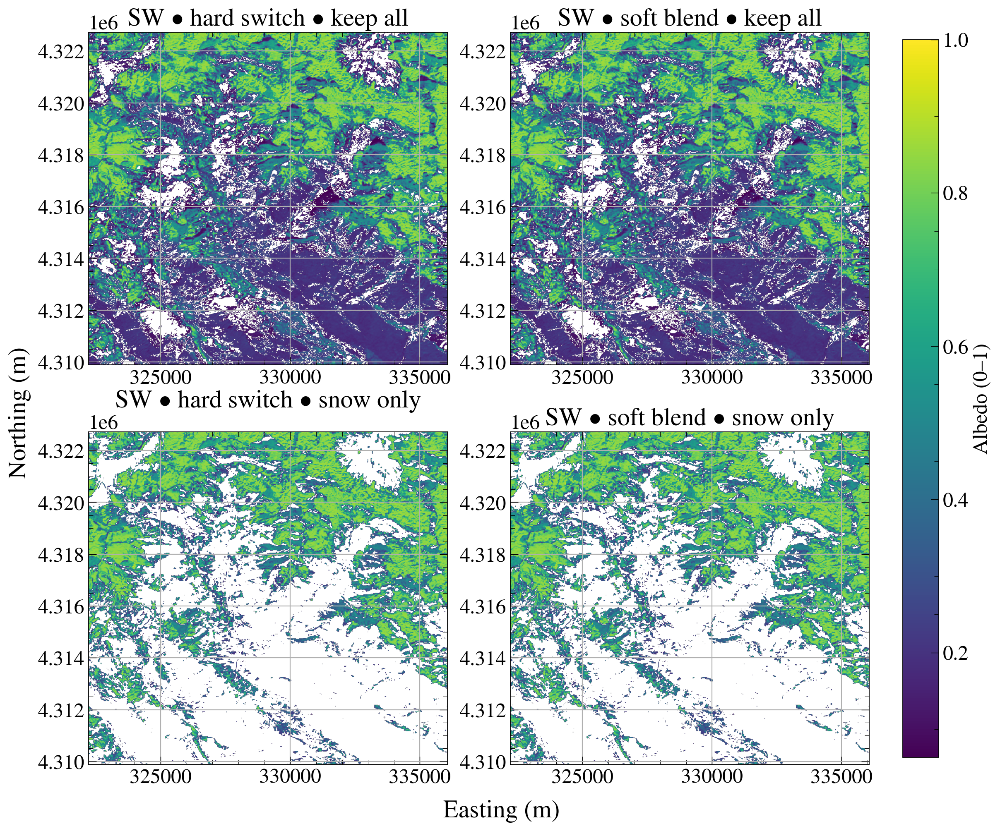

In [8]:
# date = "2021-09-03"
# date = "2022-01-16"
# date = "2021-11-12"
# date = "2023-03-07"
date = "2021-11-27"
# date = "2021-11-02"
# date = "2021-12-22"
# date = "2022-04-06"
root = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs"

# a = f"{date}_albedoSW_keepAll_hard.tif"
# b = f"{date}_albedoSW_keepAll_soft.tif"
# c = f"{date}_albedoSW_snowOnly_hard.tif"
# d = f"{date}_albedoSW_snowOnly_soft.tif"

a = f"{date}_S2_BSA20m_SW_hard.tif"
b = f"{date}_S2_BSA20m_SW_soft.tif"
c = f"{date}_S2_BSA20m_snowOnly_hard.tif"
d = f"{date}_S2_BSA20m_snowOnly_soft.tif"

paths = [os.path.join(root, p) for p in [a, b, c, d]]
title_list = [
    "SW • hard switch • keep all",
    "SW • soft blend • keep all",
    "SW • hard switch • snow only",
    "SW • soft blend • snow only",
]

fig, axes = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
axes = np.ravel(axes)  # flatten to 1D for easy zipping

last_im = None
last_crs = None

for ax, path, title in zip(axes, paths, title_list):
    with rio.open(path) as ds:
        arr = ds.read(1, masked=True)
        try:
            extent = plotting_extent(ds)  # helper
        except NameError:
            # fallback if you don't have plotting_extent
            extent = [ds.bounds.left, ds.bounds.right, ds.bounds.bottom, ds.bounds.top]
        last_crs = ds.crs

    im = ax.imshow(np.ma.filled(arr, np.nan), extent=extent, origin="upper") #, vmin=0, vmax=1)
    last_im = im
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(title)
    ax.set_aspect("equal")   # preserve map aspect
    # ax.set_xlabel("Easting")        # keep uncluttered; add CRS once below
    # ax.set_ylabel("Northing")
    
    # cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # cbar.set_label("Albedo (0–1)")

fig.supxlabel("Easting (m)")
fig.supylabel("Northing (m)")

# Single shared colorbar for all panels
cbar = fig.colorbar(last_im, ax=axes, fraction=0.046, pad=0.04)
cbar.set_label("Albedo (0–1)")

# Put CRS once as a suptitle footer (optional)
if last_crs is not None:
    fig.suptitle(str(last_crs), y=0.02, fontsize=0)

plt.show()


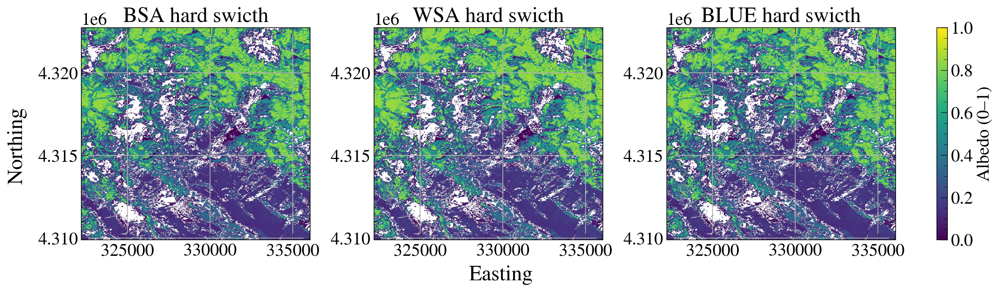

In [9]:
# root = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs"
a = f"{date}_S2_BSA20m_SW_hard.tif"
b = f"{date}_S2_WSA20m_SW_hard.tif"
c = f"{date}_S2_BLUE20m_SW_hard.tif"

fig, axs = plt.subplots(1, 3, figsize=(14,4), constrained_layout=True)
for ax, path, title in zip(axs, [f"{root}/{a}", f"{root}/{b}", f"{root}/{c}"], ["BSA hard swicth", "WSA hard swicth", "BLUE hard swicth"]):
    with rio.open(path) as ds:
        arr = ds.read(1, masked=True)
        extent = plotting_extent(ds)
    im = ax.imshow(arr, extent=extent, origin="upper")# , vmin=0, vmax=1)
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(f"{title}")
    # ax.set_xlabel("Easting")        
    # # ax.set_xlabel(ds.crs.to_string())
    # ax.set_ylabel("Northing")
    # cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # cbar.set_label("Albedo (0–1)")

fig.supxlabel("Easting")
fig.supylabel("Northing")
    
fig.colorbar(im, ax=axs, location="right", fraction=0.046, pad=0.04, label="Albedo (0–1)")
plt.show()

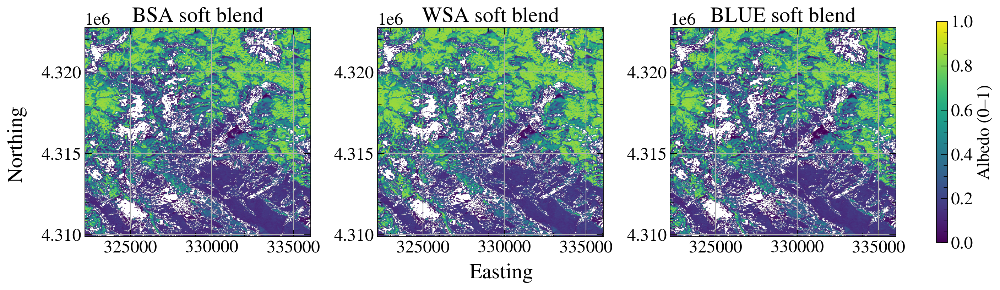

In [10]:
# root = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs"
a = f"{date}_S2_BSA20m_SW_soft.tif"
b = f"{date}_S2_WSA20m_SW_soft.tif"
c = f"{date}_S2_BLUE20m_SW_soft.tif"

fig, axs = plt.subplots(1, 3, figsize=(14,4), constrained_layout=True)
for ax, path, title in zip(axs, [f"{root}/{a}", f"{root}/{b}", f"{root}/{c}"], ["BSA soft blend", "WSA soft blend", "BLUE soft blend"]):
    with rio.open(path) as ds:
        arr = ds.read(1, masked=True)
        extent = plotting_extent(ds)
    im = ax.imshow(arr, extent=extent, origin="upper")# , vmin=0, vmax=1)
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(f"{title}")
    # ax.set_xlabel("Easting")        
    # # ax.set_xlabel(ds.crs.to_string())
    # ax.set_ylabel("Northing")
    # cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
    # cbar.set_label("Albedo (0–1)")

fig.supxlabel("Easting")
fig.supylabel("Northing")
    
fig.colorbar(im, ax=axs, location="right", fraction=0.046, pad=0.04, label="Albedo (0–1)")
plt.show()

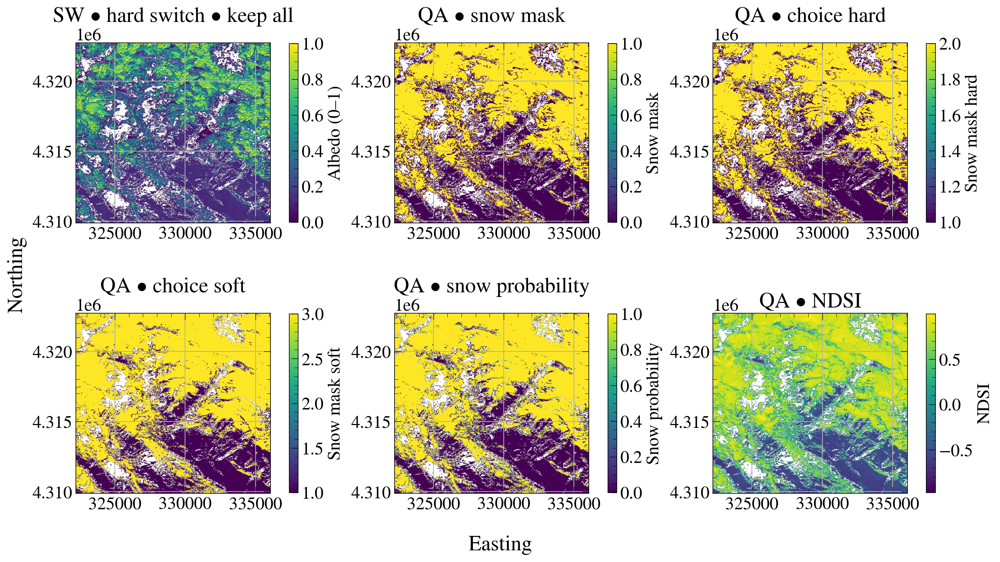

In [11]:
# root = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs"
a = f"{date}_albedoSW_keepAll_hard.tif"
b = f"{date}_S2_QA_snow_mask_qa.tif"
c = f"{date}_S2_QA_choice_hard_qa.tif"
d = f"{date}_S2_QA_choice_soft_qa.tif"
e = f"{date}_S2_QA_p_snow_qa.tif"
f = f"{date}_S2_QA_ndsi_qa.tif"

paths = [os.path.join(root, p) for p in [a, b, c, d, e, f]]

title_list = [
    "SW • hard switch • keep all", 
    "QA • snow mask", 
    "QA • choice hard", 
    "QA • choice soft", 
    "QA • snow probability", 
    "QA • NDSI"
]

color_bar_labels = [
    "Albedo (0–1)",
    "Snow mask",
    "Snow mask hard",
    "Snow mask soft",
    "Snow probability",
    "NDSI"
]

fig, axes = plt.subplots(2, 3, figsize=(14, 8), constrained_layout=True)
axes = np.ravel(axes)

# Making a copy of a colormap and set masked values transparent
cm = plt.get_cmap("viridis").copy()
cm.set_bad(alpha=0.0)  # masked pixels invisible

last_im = None
last_crs = None

for ax, path, title, colbar in zip(axes, paths, title_list, color_bar_labels):
    with rio.open(path) as ds:
        arr = ds.read(1, masked=True)  # keep as masked array (no filling)
        try:
            extent = plotting_extent(ds)
        except NameError:
            extent = [ds.bounds.left, ds.bounds.right, ds.bounds.bottom, ds.bounds.top]
        last_crs = ds.crs

    # Plot masked array directly; masked pixels use cmap "bad" color (transparent)
    # im = ax.imshow(arr, vmin=0, vmax=1, extent=extent, origin="upper", cmap=cm)
    im = ax.imshow(arr, extent=extent, origin="upper", cmap=cm)
    last_im = im
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(title)
    ax.set_aspect("equal")
    # ax.set_xlabel("")
    # ax.set_ylabel("")
    
    cbar = fig.colorbar(last_im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(colbar)

fig.supxlabel("Easting")
fig.supylabel("Northing")
    
# # Shared colorbar
# cbar = fig.colorbar(last_im, ax=axes, fraction=0.046, pad=0.04)
# cbar.set_label("Albedo (0–1)")

if last_crs is not None:
    fig.suptitle(str(last_crs), y=0.02, fontsize=0)

plt.show()
